# importing important libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from IPython.display import Image
from sklearn import tree
from os import system


In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### importing data set

In [3]:
df=pd.read_csv("C:/Users/dhruv/Downloads/healthcare-dataset-stroke-data.csv")
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.00,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.00,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.00,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.00,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.00,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,56669,Male,81.00,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
6,53882,Male,74.00,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1
7,10434,Female,69.00,0,0,No,Private,Urban,94.39,22.8,never smoked,1
8,27419,Female,59.00,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
9,60491,Female,78.00,0,0,Yes,Private,Urban,58.57,24.2,Unknown,1


In [4]:
df.shape # data set having 5110 rows and 12 columns.

(5110, 12)

In [5]:
df.columns

Index(['id', 'gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [7]:
df.isnull().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [8]:
df.describe()  # describe stats of numerical columns

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [9]:
df.describe(include = "all")  # describe stats of numerical as well as categorical columns

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,5110.000000,5110,5110.000000,5110.000000,5110.000000,5110,5110,5110,5110.000000,4909.000000,5110,5110.000000
unique,NaN,3,NaN,NaN,NaN,2,5,2,NaN,NaN,4,NaN
top,NaN,Female,NaN,NaN,NaN,Yes,Private,Urban,NaN,NaN,never smoked,NaN
freq,NaN,2994,NaN,NaN,NaN,3353,2925,2596,NaN,NaN,1892,NaN
mean,36517.829354,NaN,43.226614,0.097456,0.054012,NaN,NaN,NaN,106.147677,28.893237,NaN,0.048728
std,21161.721625,NaN,22.612647,0.296607,0.226063,NaN,NaN,NaN,45.283560,7.854067,NaN,0.215320
min,67.000000,NaN,0.080000,0.000000,0.000000,NaN,NaN,NaN,55.120000,10.300000,NaN,0.000000
25%,17741.250000,NaN,25.000000,0.000000,0.000000,NaN,NaN,NaN,77.245000,23.500000,NaN,0.000000
50%,36932.000000,NaN,45.000000,0.000000,0.000000,NaN,NaN,NaN,91.885000,28.100000,NaN,0.000000
75%,54682.000000,NaN,61.000000,0.000000,0.000000,NaN,NaN,NaN,114.090000,33.100000,NaN,0.000000


In [10]:
df = df.drop("id", axis = 1)  # dropping ID column
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.00,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.00,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,Male,80.00,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.00,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.00,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,Male,81.00,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
6,Male,74.00,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1
7,Female,69.00,0,0,No,Private,Urban,94.39,22.8,never smoked,1
8,Female,59.00,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
9,Female,78.00,0,0,Yes,Private,Urban,58.57,24.2,Unknown,1


In [11]:
df.shape   # after removing id column the number of columns become 11

(5110, 11)

In [12]:
mean_bmi=df["bmi"].mean()  # mean of  bmi attribute
mean_bmi

28.893236911794673

In [13]:
mode_smoke=df["smoking_status"].mode() # mode of smoking_status column
mode_smoke

0    never smoked
dtype: object

In [14]:
df["bmi"]=df["bmi"].replace(np.NaN,mean_bmi)  # replacing missing values in bmi attribute by mean

df['smoking_status'] = df['smoking_status'].str.replace('Unknown','never smoked')  # Replacing the unknowns by mode in smoking_status column


df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             5110 non-null   object 
 1   age                5110 non-null   float64
 2   hypertension       5110 non-null   int64  
 3   heart_disease      5110 non-null   int64  
 4   ever_married       5110 non-null   object 
 5   work_type          5110 non-null   object 
 6   Residence_type     5110 non-null   object 
 7   avg_glucose_level  5110 non-null   float64
 8   bmi                5110 non-null   float64
 9   smoking_status     5110 non-null   object 
 10  stroke             5110 non-null   int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 439.3+ KB


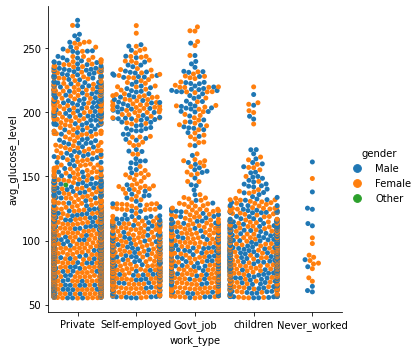

In [15]:
sns.catplot(x="work_type", y="avg_glucose_level", hue = "gender", kind = "swarm", data=df)

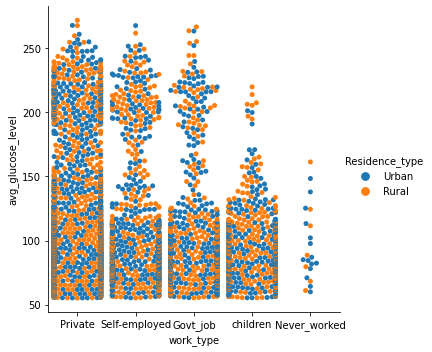

In [16]:
sns.catplot(x="work_type", y="avg_glucose_level", hue = "Residence_type", kind = "swarm", data=df)

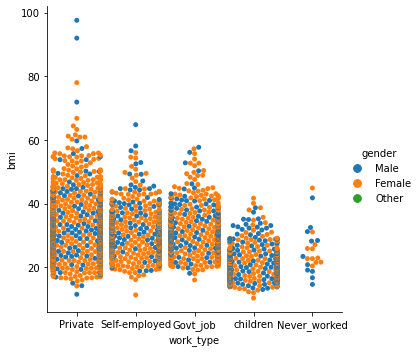

In [17]:
sns.catplot(x="work_type", y="bmi", hue = "gender", kind = "swarm", data=df)


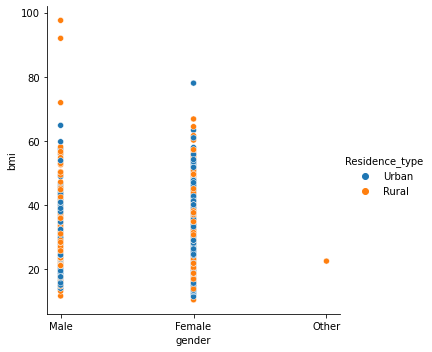

In [18]:
sns.relplot(x='gender',y='bmi',hue='Residence_type',data=df);

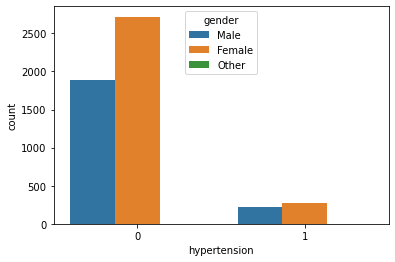

In [19]:
sns.countplot(data=df,x='hypertension',hue='gender');

In [20]:
pd.crosstab(df['work_type'], df['Residence_type'] )

Residence_type,Rural,Urban
work_type,,
Govt_job,312,345
Never_worked,7,15
Private,1462,1463
Self-employed,393,426
children,340,347


In [21]:
pd.crosstab(df['hypertension'], df['gender'] )

gender,Female,Male,Other
hypertension,,,
0,2718,1893,1
1,276,222,0


In [22]:
pd.crosstab(df['work_type'], df['hypertension'] )

hypertension,0,1
work_type,,
Govt_job,584,73
Never_worked,22,0
Private,2644,281
Self-employed,675,144
children,687,0


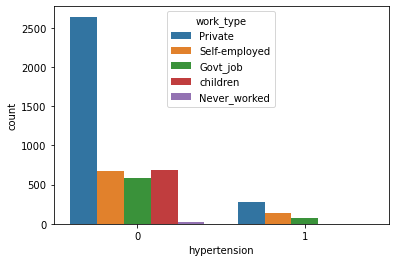

In [23]:
sns.countplot(data=df,x='hypertension',hue='work_type');

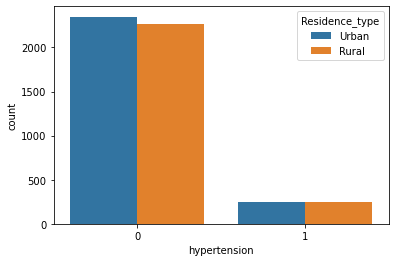

In [24]:
sns.countplot(data=df,x='hypertension',hue='Residence_type');

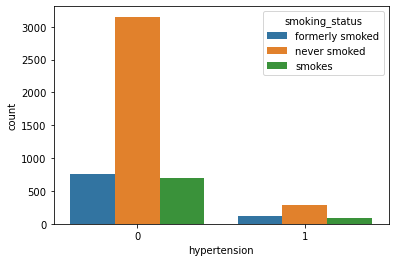

In [25]:
sns.countplot(data=df,x='hypertension',hue='smoking_status');

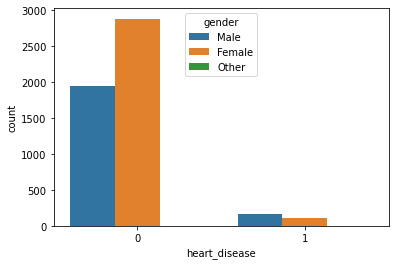

In [26]:
sns.countplot(data=df,x='heart_disease',hue='gender');

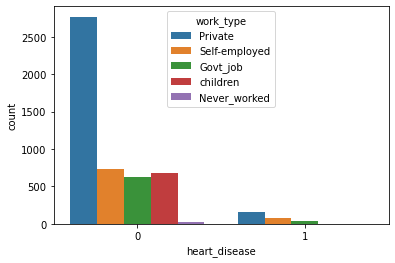

In [27]:
sns.countplot(data=df,x='heart_disease',hue='work_type');

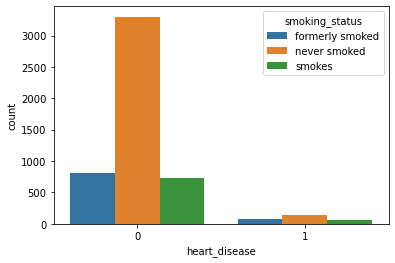

In [28]:
sns.countplot(data=df,x='heart_disease',hue='smoking_status');

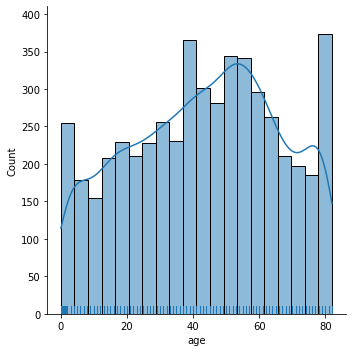

In [29]:
sns.displot(df.age,kde=True,rug=True)

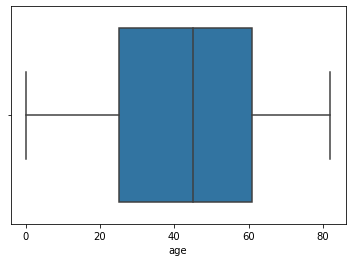

In [30]:
sns.boxplot(df['age']);

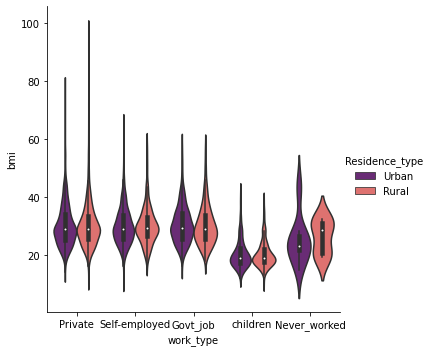

In [31]:
sns.catplot(x="work_type", y="bmi", hue = "Residence_type", kind = "violin", data=df,  palette="magma")

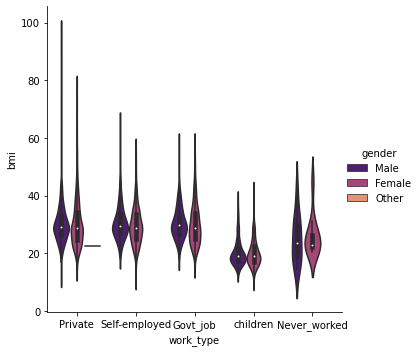

In [32]:
sns.catplot(x="work_type", y="bmi", hue = "gender", kind = "violin", data=df,  palette="magma")

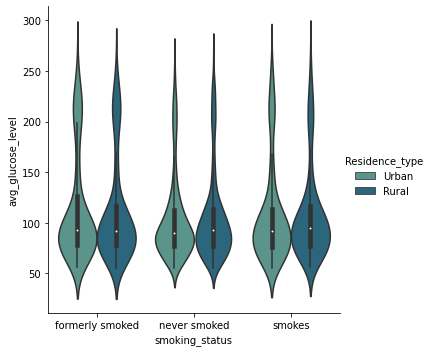

In [33]:
sns.catplot(x="smoking_status", y="avg_glucose_level", hue = "Residence_type", kind = "violin", data=df,  palette = 'crest')

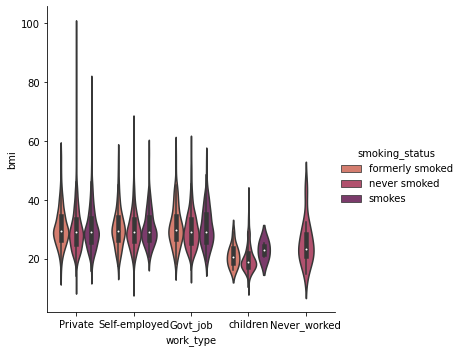

In [34]:
sns.catplot(x="work_type", y="bmi", hue = "smoking_status", kind = "violin", data=df,  palette="flare")

In [35]:
df.describe()

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000
mean,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,22.612647,0.296607,0.226063,45.283560,7.698018,0.215320
min,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,25.000000,0.000000,0.000000,77.245000,23.800000,0.000000
50%,45.000000,0.000000,0.000000,91.885000,28.400000,0.000000
75%,61.000000,0.000000,0.000000,114.090000,32.800000,0.000000
max,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


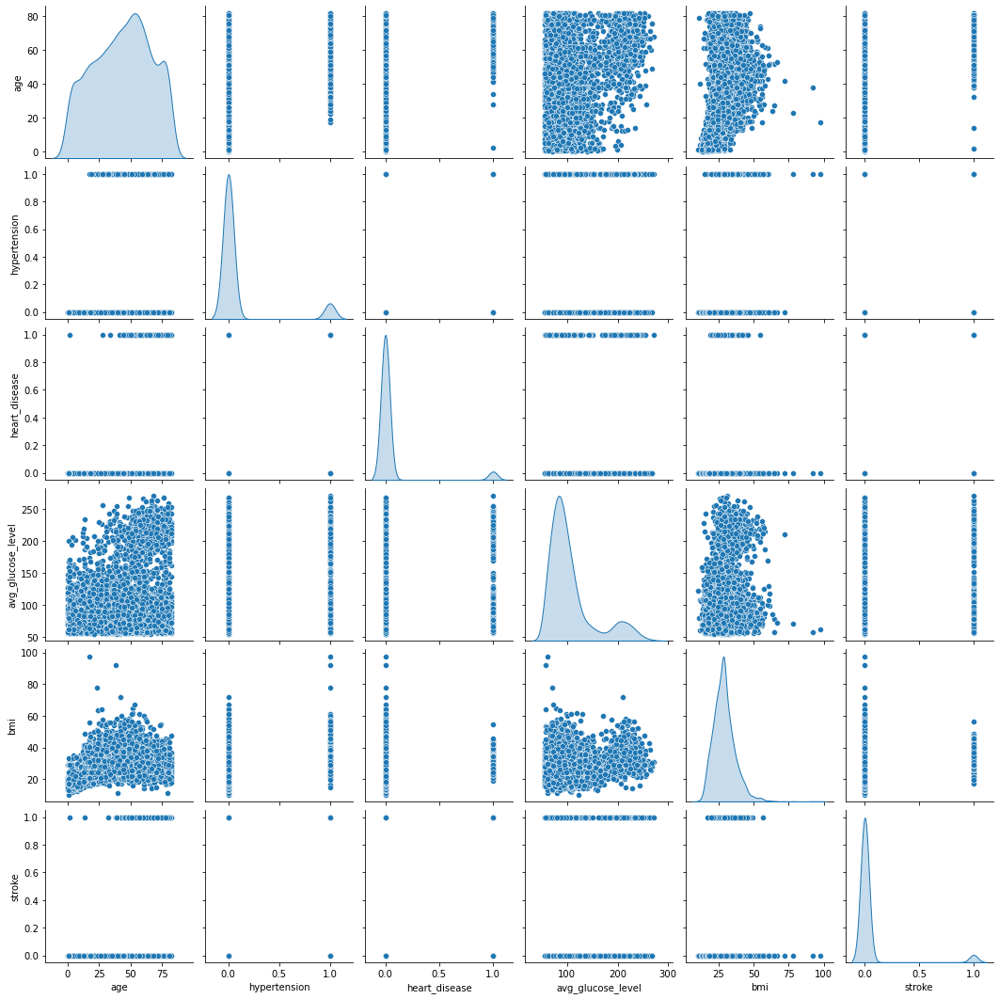

In [36]:
sns.pairplot(df, diag_kind = 'kde')

In [37]:
##Heat map

corrmat=df.corr()
corrmat

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
age,1.000000,0.276398,0.263796,0.238171,0.325942,0.245257
hypertension,0.276398,1.000000,0.108306,0.174474,0.160189,0.127904
heart_disease,0.263796,0.108306,1.000000,0.161857,0.038899,0.134914
avg_glucose_level,0.238171,0.174474,0.161857,1.000000,0.168751,0.131945
bmi,0.325942,0.160189,0.038899,0.168751,1.000000,0.038947
stroke,0.245257,0.127904,0.134914,0.131945,0.038947,1.000000


<AxesSubplot:>

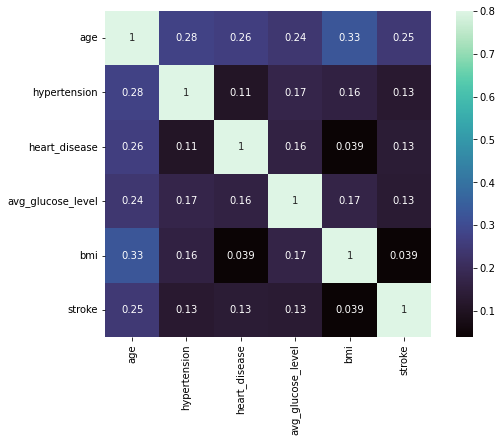

In [38]:

f,ax=plt.subplots(figsize=(9,6))

sns.heatmap(corrmat,vmax=0.8,square=True,annot=True, cmap = 'mako')

In [39]:
df["gender"].unique()

array(['Male', 'Female', 'Other'], dtype=object)

In [40]:
df["ever_married"].unique()

array(['Yes', 'No'], dtype=object)

In [41]:
df["work_type"].unique()

array(['Private', 'Self-employed', 'Govt_job', 'children', 'Never_worked'],
      dtype=object)

In [42]:
df["Residence_type"].unique()

array(['Urban', 'Rural'], dtype=object)

In [43]:
df["smoking_status"].unique()

array(['formerly smoked', 'never smoked', 'smokes'], dtype=object)

## One Hot encoding
### converting categorical columns into numerical columns

In [44]:
dummies = pd.get_dummies(df[['gender','ever_married','work_type','Residence_type','smoking_status']],columns=['gender','ever_married','work_type','Residence_type','smoking_status'],drop_first=True)

In [45]:
columns=['gender','ever_married','work_type','Residence_type','smoking_status']
df = pd.concat([df, dummies], axis = 1)
df.drop(columns, axis = 1, inplace = True)

In [46]:
df

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,gender_Male,gender_Other,ever_married_Yes,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,Residence_type_Urban,smoking_status_never smoked,smoking_status_smokes
0,67.00,0,1,228.69,36.600000,1,1,0,1,0,1,0,0,1,0,0
1,61.00,0,0,202.21,28.893237,1,0,0,1,0,0,1,0,0,1,0
2,80.00,0,1,105.92,32.500000,1,1,0,1,0,1,0,0,0,1,0
3,49.00,0,0,171.23,34.400000,1,0,0,1,0,1,0,0,1,0,1
4,79.00,1,0,174.12,24.000000,1,0,0,1,0,0,1,0,0,1,0
5,81.00,0,0,186.21,29.000000,1,1,0,1,0,1,0,0,1,0,0
6,74.00,1,1,70.09,27.400000,1,1,0,1,0,1,0,0,0,1,0
7,69.00,0,0,94.39,22.800000,1,0,0,0,0,1,0,0,1,1,0
8,59.00,0,0,76.15,28.893237,1,0,0,1,0,1,0,0,0,1,0
9,78.00,0,0,58.57,24.200000,1,0,0,1,0,1,0,0,1,1,0


In [47]:
df.shape

(5110, 16)

### searching for duplicates

In [48]:
duplicate = df.duplicated()     
print(duplicate.sum())   # This code will givesum of or  total number of duplicate rows
df[duplicate]   #  This command shows all the duplicate rows.

0


,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,gender_Male,gender_Other,ever_married_Yes,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,Residence_type_Urban,smoking_status_never smoked,smoking_status_smokes


# no duplicates

In [49]:
#model

x=df.drop(['heart_disease'],axis=1)

y=df['heart_disease']

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=0)

# LOGISTIC REGRESSION

In [50]:
reg_model=LogisticRegression()
reg_model.fit(x_train,y_train)

print("train score - ",reg_model.score(x_train,y_train))
print("test score - ",reg_model.score(x_test,y_test))

train score -  0.9449259155717081
test score -  0.9445531637312459


0.9445531637312459
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1451
           1       0.41      0.09      0.14        82

    accuracy                           0.94      1533
   macro avg       0.68      0.54      0.56      1533
weighted avg       0.92      0.94      0.93      1533

[[1441   10]
 [  75    7]]


<AxesSubplot:>

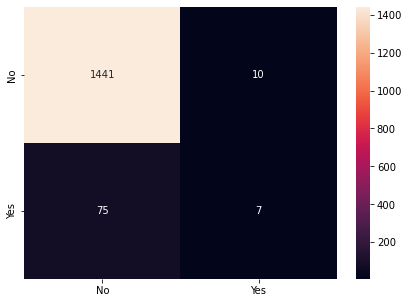

In [51]:
#confusion metrices
predictions=reg_model.predict(x_test)

from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,predictions))


from sklearn import metrics
print(metrics.classification_report(y_test,predictions))

from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,predictions))

cm=metrics.confusion_matrix(y_test,predictions,labels=[0,1])
df_cm=pd.DataFrame(cm,index=[i for i in ['No','Yes']],columns=[i for i in ['No','Yes']])

plt.figure(figsize=(7,5))
sns.heatmap(df_cm,annot=True,fmt='g')

#  DECISION TREE

In [53]:
# Decision Tree Score

from sklearn.tree import DecisionTreeClassifier

dTree=DecisionTreeClassifier(criterion='gini',max_depth=5,random_state=0)
dTree.fit(x_train,y_train)
print(dTree.score(x_train,y_train))
print(dTree.score(x_test,y_test))  

0.9496785015376014
0.9347684279191129


In [54]:
train_char_label = ['0', '1']
healthcare_Tree_File = open('healthcare_tree.dot', 'w')
dot_data = tree.export_graphviz(dTree, out_file=healthcare_Tree_File, feature_names = list(x_train), class_names = list(train_char_label))
healthcare_Tree_File.close()

In [55]:
retCode = system("dot -Tpng healthcare_tree.dot -o healthcare_tree.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("C:/Users/dhruv/Downloads/healthcare _tree.png"))

system command returning error: 1


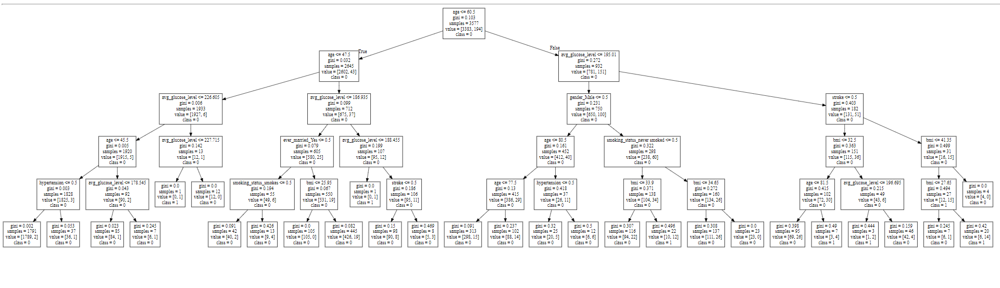

# BAGGING

In [56]:
#Ensemble Learning - Bagging
from sklearn.ensemble import BaggingClassifier
bgcl = BaggingClassifier(n_estimators=45,base_estimator=dTree,random_state=0)
bgcl = bgcl.fit(x_train,y_train)
y_predict = bgcl.predict(x_test)
print(bgcl.score(x_train,y_train))
print(bgcl.score(x_test,y_test))

0.9493989376572547
0.9458577951728636


# RANDOM FOREST

In [65]:
from sklearn.ensemble import RandomForestClassifier

Ran_model=RandomForestClassifier(n_estimators=30,max_depth=5,random_state=0)
Ran_model.fit(x_train,y_train)
print("train score - ",Ran_model.score(x_train,y_train))
print("test score - ",Ran_model.score(x_test,y_test))

train score -  0.9457646072127481
test score -  0.9465101108936725


# ADABOOSTING

In [57]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=20, random_state=0)
abcl = abcl.fit(x_train, y_train)
y_predict = abcl.predict(x_test)
print(abcl.score(x_train, y_train))
print(abcl.score(x_test, y_test))

0.9449259155717081
0.943900848010437


# GRADIENT BOOSTING

In [61]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 15, random_state=0)
gbcl = gbcl.fit(x_train, y_train)
y_predit = gbcl.predict(x_test)
print(gbcl.score(x_train, y_train))
print(gbcl.score(x_test, y_test))

0.9457646072127481
0.9458577951728636


In [62]:
pip install xgboost

# XG BOOSTING

In [63]:
from xgboost import XGBClassifier
xgbcl = XGBClassifier(n_estimators = 15, random_state=0)
xgbcl = xgbcl.fit(x_train, y_train)
y_predict = xgbcl.predict(x_test)
print(xgbcl.score(x_train, y_train))
print(xgbcl.score(x_test, y_test))

0.9616997483925077
0.9432485322896281
